## Finding the Efficient Frontier using Monte Carlo simulations

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import yfinance as yf
import numpy as np
import pandas as pd

In [3]:
import matplotlib.pyplot as plt
import warnings
import seaborn as sns

plt.style.use('seaborn')
sns.set_palette('cubehelix')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

### Set up the parameters:

In [4]:
N_PORTFOLIOS = 10 ** 5
N_DAYS = 365

# top 10 sharpe
# RISKY_ASSETS = ['XWC-USD','DGD-USD','ETH-USD','BTC-USD','GNO-USD','LRC-USD','XEM-USD','ANT-USD','ADA-USD','LINK-USD']
# method 2
RISKY_ASSETS = ['XWC-USD', 'DGD-USD', 'LRC-USD', 'ANT-USD', 'ADA-USD', 'KNC-USD','DNT-USD', 'ICX-USD','DGB-USD', 'LTC-USD']
START_DATE = '2020-01-01'
END_DATE = '2020-12-31'

n_assets = len(RISKY_ASSETS)

In [5]:
prices_df = yf.download(RISKY_ASSETS, start=START_DATE, end=END_DATE, adjusted=True)
print(f'Downloaded {prices_df.shape[0]} rows of data.')

[*********************100%***********************]  10 of 10 completed
Downloaded 362 rows of data.


### Calculate annualized average returns and the corresponding standard deviation:

In [6]:
returns_df = prices_df['Close'].pct_change().dropna()

avg_returns = returns_df.mean() * N_DAYS
cov_mat = returns_df.cov() * N_DAYS

### Simulate random portfolio weights:

In [7]:
np.random.seed(42)
weights = np.random.random(size=(N_PORTFOLIOS, n_assets))
weights /=  np.sum(weights, axis=1)[:, np.newaxis]
# weights[0]

### Calculate portfolio metrics:

In [8]:
# RETURNS / EXPECTED RETURNS
portf_rtns = np.dot(weights, avg_returns)

# VOLATILITY / STANDARD DEVIATION
portf_vol = []
for i in range(0, len(weights)):
    portf_vol.append(np.sqrt(np.dot(weights[i].T, np.dot(cov_mat, weights[i]))))

portf_vol = np.array(portf_vol)

# SHARPE RATIO
portf_sharpe_ratio = portf_rtns / portf_vol

### Create a joint DataFrame with all data:

In [9]:
portf_results_df = pd.DataFrame({'returns': portf_rtns,
                                 'volatility': portf_vol,
                                 'sharpe_ratio': portf_sharpe_ratio})
# portf_results_df.head()

### Plot using plotly

In [10]:
import plotly.express as px
fig = px.scatter(portf_results_df, x="volatility", y="returns", color='sharpe_ratio')
fig.update_traces(marker=dict(size=10,
                              line=dict(width=1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

## Display weights, returns, volatility and sharpe ratio in tables

In [11]:
import plotly.graph_objects as go

def display_weights(cryptos_list, weights):
    fig = go.Figure(data=[go.Table(header=dict(values=['Ticker','Weight (%)']),
                 cells=dict(values=[cryptos_list, (weights*100).round(2)]))])
    fig.show()

In [12]:
# display_weights(RISKY_ASSETS, portf_weights_from_vol)

In [13]:
def display_rtn_vol_sharpe(portf_results_df, portf_ind):
    fig = go.Figure(data=[go.Table(header=dict(values=['Metric','Value']),
                 cells=dict(values=[['Returns', 'Volatility', 'Sharpe Ratio'], (portf_results_df.loc[portf_ind]).round(2)]))])
    fig.show()

### Display Max Sharpe Ratio Portfolio

In [14]:
def max_sharpe(portf_results_df, weights):
    max_sharpe_ind = np.argmax(portf_results_df.sharpe_ratio)
    max_sharpe_portf_weights = weights[max_sharpe_ind]
    
    return max_sharpe_ind, max_sharpe_portf_weights

In [15]:
max_sharpe_ind, max_sharpe_portf_weights = max_sharpe(portf_results_df, weights)

In [16]:
display_weights(RISKY_ASSETS, max_sharpe_portf_weights)
display_rtn_vol_sharpe(portf_results_df, max_sharpe_ind)

### Display Portfolio when user input Volatility

In [17]:
def truncate(num, n):
    integer = int(num * (10**n))/(10**n)
    return float(integer)
# elif truncate(portf_results_df['volatility'][i],2) == vol_input:
#     portfolios_consider[i] = portf_results_df['returns'][i]

In [18]:
# display range of possible volatility input
def get_min_max_vol(portf_results_df):
    min_vol_ind = np.argmin(portf_results_df.volatility)
    min_vol_value = portf_results_df['volatility'][min_vol_ind].round(2)

    max_vol_ind = np.argmax(portf_results_df.volatility)
    max_vol_value = portf_results_df['volatility'][max_vol_ind].round(2)
    return min_vol_value, max_vol_value

In [19]:
min_vol_value, max_vol_value = get_min_max_vol(portf_results_df)
print('Input a value in between:', min_vol_value,'-', max_vol_value)

Input a value in between: 0.93 - 4.48


In [20]:
# user input would be in 2dp
vol_input = 3.97

In [21]:
def port_exists_vol_input(vol_input):
    for i in range(N_PORTFOLIOS):
        if portf_results_df['volatility'][i].round(2) == vol_input:
            return True
    return False

In [22]:
def portf_ind_from_vol(vol_input):
    portfolios_consider = {}
    for i in range(N_PORTFOLIOS):
        if portf_results_df['volatility'][i].round(2) == vol_input:
            portfolios_consider[i] = portf_results_df['returns'][i]
            found = True


    max_key = max(portfolios_consider, key=portfolios_consider.get)
    return max_key

In [23]:
if port_exists_vol_input(vol_input):
    index_from_vol = portf_ind_from_vol(vol_input)
    weights_from_vol = weights[index_from_vol]
    
    # display tables
    display_weights(RISKY_ASSETS, weights_from_vol)
    display_rtn_vol_sharpe(portf_results_df, index_from_vol)
else:
    print('Portfolio with a historical volatility of', vol_input, 'does not exist')

### Display Lowest Volatility Portfolio

In [24]:
min_vol_ind = portf_ind_from_vol(min_vol_value)
min_vol_portf_weights = weights[min_vol_ind]

In [25]:
display_weights(RISKY_ASSETS, min_vol_portf_weights)
display_rtn_vol_sharpe(portf_results_df, min_vol_ind)

### Display Portfolio when user input Expected Returns

In [26]:
# display range of possible return input
# min rtn should be rtn of min volatility portfolio
def get_min_max_rtns(portf_results_df):
    min_rtn_value = portf_results_df['returns'][min_vol_ind].round(2)

    max_rtn_ind = np.argmax(portf_results_df.returns)
    max_rtn_value = portf_results_df['returns'][max_rtn_ind].round(2)
    return min_rtn_value,max_rtn_value

In [27]:
min_rtn_value, max_rtn_value = get_min_max_rtns(portf_results_df)
print('Input a value in between:', min_rtn_value,'-', max_rtn_value)

Input a value in between: 2.4 - 14.5


In [28]:
# user input would be in 2dp
rtn_input = 13

In [29]:
def port_exists_rtn_input(rtn_input):
    for i in range(N_PORTFOLIOS):
        if portf_results_df['returns'][i].round(2) == rtn_input:
            return True
    return False

In [30]:
def portf_ind_from_rtn(rtn_input):
    portfolios_consider = {}
    for i in range(N_PORTFOLIOS):
        if portf_results_df['returns'][i].round(2) == rtn_input:
            portfolios_consider[i] = portf_results_df['volatility'][i]
    
    min_key = min(portfolios_consider, key=portfolios_consider.get)

    return min_key

In [31]:
if port_exists_rtn_input(rtn_input):
    index_from_rtn = portf_ind_from_rtn(rtn_input)
    weights_from_rtn = weights[index_from_rtn]
    
    # display tables
    display_weights(RISKY_ASSETS, weights_from_rtn)
    display_rtn_vol_sharpe(portf_results_df, index_from_rtn)
else:
    print('Portfolio with an expected return of', rtn_input, 'does not exist')

Portfolio with an expected return of 13 does not exist


### Display Max Returns Portfolio

In [32]:
max_rtns_ind = portf_ind_from_rtn(max_rtn_value)
max_rtns_portf_weights = weights[max_rtns_ind]

In [33]:
display_weights(RISKY_ASSETS, max_rtns_portf_weights)
display_rtn_vol_sharpe(portf_results_df, max_rtns_ind)

### Getting Returns Series & Volatility dfs

In [34]:
close_df = prices_df['Close']

In [35]:
def get_rtn_series_df(close_df, weights):
    rtn_series = (close_df.pct_change()+1).cumprod() - 1 
    weighted_rtn_series = weights * rtn_series
    final_rtn_series = weighted_rtn_series.sum(axis=1)
    
    return final_rtn_series

In [36]:
# pass in a different set of weights to plot the return series of that portfolio
rtn_series_df = get_rtn_series_df(close_df, max_rtns_portf_weights)

<AxesSubplot:xlabel='Date'>

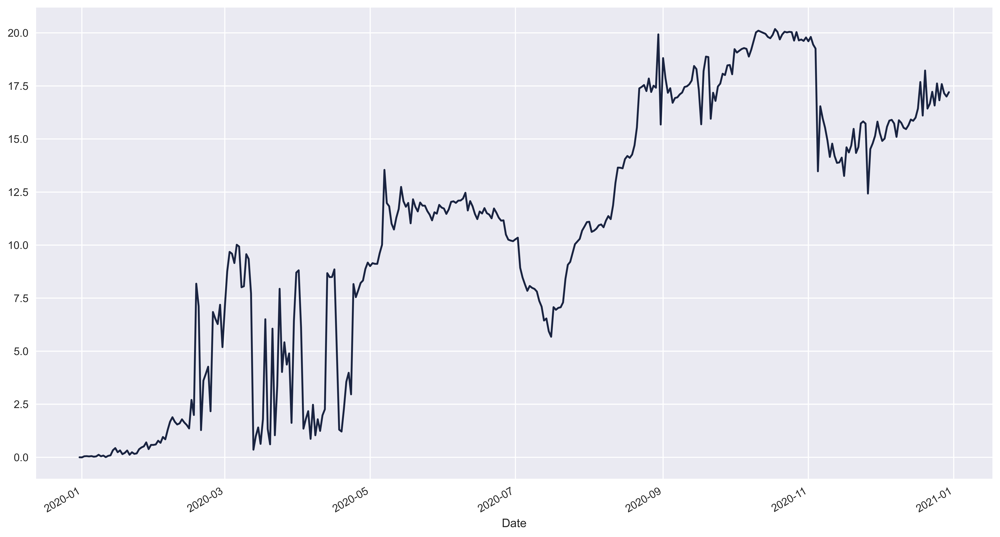

In [37]:
rtn_series_df.plot(figsize=(16,9))

In [38]:
def get_rolling_volatility_df(rtn_series, rolling_window):
    return pd.DataFrame.rolling(np.log((rtn_series+1)/(rtn_series+1).shift(1)),window=rolling_window).std() * np.sqrt(365)

In [39]:
rolling_volatility_df = get_rolling_volatility_df(rtn_series_df, 20)

<AxesSubplot:xlabel='Date'>

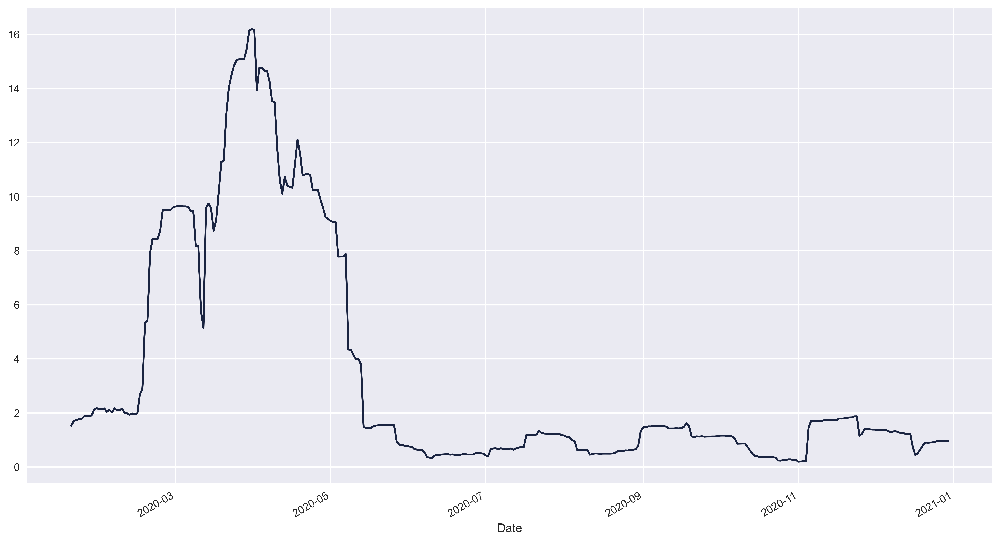

In [40]:
rolling_volatility_df.plot(figsize=(16,9))